# Wstęp

Przyjrzyjmy się na koniec dwóm ciekawym zagadnieniom: dzieleniu sekretu i steganrografii. Steganografia jako taka polega na ukrywaniu informacji. Niekoniecznie natomiast wiąże się z jej szyfrowaniem (choć te dwie techniki oczywiście można połączyć). Dzielenie sekretu to nie jest szyfrowanie, haszowanie czy ukrywanie - to jeszcze inna bajka i od niej zaczniemy.

## Dzielenie sekretu

Wyjść trzeba od tego co to jest sekret. Jak już na pewno dało się zauważyć na naszych zajęciach - może to być wszystko. Liczba, tekst, obraz... bo wszystko to jest ciągiem binarnym i może być interpretowane jak nam wygodnie (np. jako liczba czy tablica bajtów). 

Na czym więc podlega to całe dzielenie? Otóż chodzi o to, aby całość sekretu podzielić na $X$ kawałków. Te kawałki zwą się udziałami i mogą mieć różne formy - to zależy od wybranego algorytmu (o tym za chwilę). Do przywrócenia sekretu konieczne jest posiadanie przynajmniej $N$ udziałów, gdzie $1 < N \leq X$. W zależności od wybranej wersji algorytmu nie musi być konieczne posiadanie wszystkich $X$ udziałów - choć oczywiście i tak bywa. 

Podsumowując:
1. pojedynczy udział niesie dokładnie 0% informacji o sekrecie,
2. $N - 1$ udziałów pozwala przywrócić 0% sekretu,
3. $N$ udziałów lub więcej pozwala przywrócić dokładnie 100% sekretu.

Dzisiaj poznasz trzy algorytmy pozwalające spełnić te założenia.

### Protokół Blakley'a

**Protokół Blakleya** jest algorytmem dzielenia sekretu spełniającym założenia opisane we wstępie. Sama idea jest taka, że w n-wymiarowej przestrzeni możemy zdefiniować n podprzestrzeni o kowymiarze równym 1, które przecinają się w jednym punkcie. Kowymiar jest różnicą pomiędzy wymiarem przestrzeni w której definiujemy podprzestrzenie, a wymiarem podprzestrzeni. Przykłady:

1. weźmy dwie proste narysowane na płaszczyźnie. Płaszczyzna  jest dwuwymiarowa, a proste są jednowymiarowe. Kowymiar więc się zgadza (2 – 1 = 1). Dwie takie proste zawsze dadzą jeden punkt przecięcia pod warunkiem, że nie będą równoległe. Dla dociekliwych: w przestrzeni euklidesowej, ale innych nie będziemy tutaj rozważać.

2. jako drugi przykład rozpatrzmy trzy płaszczyzny (2D) w przestrzeni trójwymiarowej (3D). Kowymiar również się zgadza (3 – 2 = 1). Prawidłowo dobrane (tutaj ograniczeń jest więcej, nie wystarczy fakt, że nie są równoległe), będą dawały jeden punkt w którym wszystkie się przecinają.


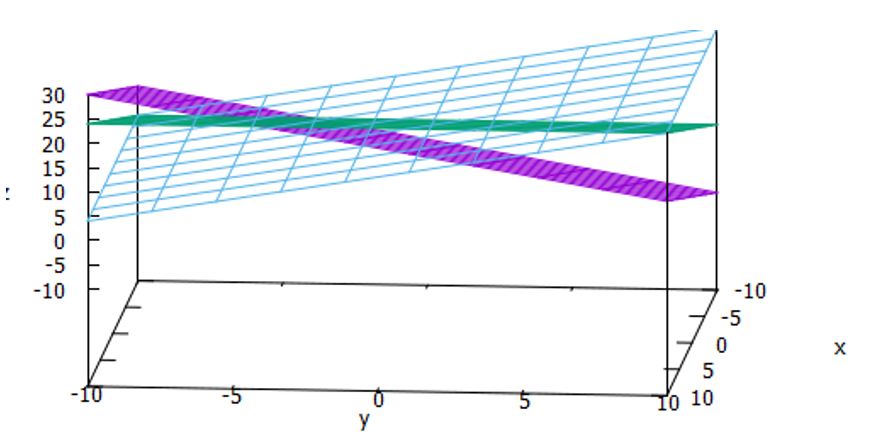


Im więcej wymiarów, tym trudniej to sobie wyobrazić. W każdym razie, sekretem jest (zawsze, bez względu na wymiar podprzestrzeni) jedna dowolna współrzędna punktu przecięcia. Załóżmy np. współrzędną $z$.

**Płaszczyzna** w klasycznej formie zadana jest wzorem:

\begin{equation}
  \pi: Ax + By + Cz + D = 0.
\end{equation}
Gdzie A, B, C i D to wartości stałe. Inną formą przedstawienia płaszczyzny jest:
\begin{equation}
  \pi: A(x - x_0) + B(y - y_0) + C(z - z_0) = 0.
\end{equation}
Gdzie $n = [A, B, C]$ jest wektorem normalnym płaszczyzny $\pi$ (czyli prostopadłym do niej), natomiast $P_0(x_0, y_0, z_0) \in \pi$. Generalnie do jednoznacznego  zdefiniowania płaszczyzny potrzeba trzech punktów. Jednak jest pewne założenie które muszą one spełniać. Zastanów się jakie, może to być potrzebne. 

Załóżmy więc, że mamy 3 punkty: $P_1(x_1, y_1, z_1)$, $P_2(x_2, y_2, z_2)$, $P_3(x_3, y_3, z_3)$ i wszystkie należą do $\pi$. Do wyznaczenia wzoru musimy utwórzyć dwa dowolne wektory z tych punktów, np.: $\overrightarrow{P_1P_2}$, $\overrightarrow{P_1P_3}$. Następnie należy obliczyć iloczyn wektorowy, który da nam parametry $A, B, C$: $\overrightarrow{P_1P_2} \times \overrightarrow{P_1P_3} = [A, B, C]$. Posiadając $A, B, C$, możemy wyznaczyć równanie płaszczyzny wstawiając dowolny z 3 puntków do równania $\pi$.

**Zadanie**

Otrzymałeś 3 pliki png w folderze *Blakley*. Każdy obraz reprezentuje punkty jednej płaszczyzny, innej niż są zakodowane w pozostałych obrazach. Przez punkt na płaszczyźnie rozumiemy piksel obrazu, który posiada współrzędne (x, y) (obie są z zakresu od 0 do 99), oraz wartość z (od 0 do 255) zakodowaną na kanale R, G albo B. Współrzędna x określa położenie piksela względem szerokości obrazu (czyli kolumny), a y względem jego wysokości (czyli wiersze).  
Wyznacz trzecią współrzędną punktu przecięcia płaszczyzn (czyli z) która jest sekretem - jeżeli punkt przecięcia istnieje. 

Zaproponuj równania (bez tworzenia obrazów) trzech płaszczyzn, które się przecinają w jednym punkcie, a współrzędna $z$ tego przecięcia to rok Twojego urodzenia. Unikaj równań typu: z = 0 itp. Niech to będą ,,normalne'' płaszczyzny.


**Uwaga** w tym zadaniu nie musisz nic kodować (choć oczywiście możesz), ale możesz też przedstawić swoje obliczenia/wyniki poniżej.

In [1]:
from PIL import Image
import numpy as np

In [2]:
with Image.open("Blakley/Plane1.png") as im:
    im_arr1 = np.asarray(im)
print("Plane1:")
print(f"x = {15}, y = {25}, z = {im_arr1[15, 25][0]}")
print(f"x = {40}, y = {20}, z = {im_arr1[40, 20][0]}")
print(f"x = {70}, y = {75}, z = {im_arr1[70, 75][0]}")
print()

with Image.open("Blakley/Plane2.png") as im:
    im_arr2 = np.asarray(im)
print("Plane2:")
print(f"x = {15}, y = {25}, z = {im_arr2[15, 25][1]}")
print(f"x = {40}, y = {20}, z = {im_arr2[40, 20][1]}")
print(f"x = {70}, y = {75}, z = {im_arr2[70, 75][1]}")
print()
    
with Image.open("Blakley/Plane3.png") as im:
    im_arr3 = np.asarray(im)
print("Plane3:")
print(f"x = {15}, y = {25}, z = {im_arr3[15, 25][2]}")
print(f"x = {40}, y = {20}, z = {im_arr3[40, 20][2]}")
print(f"x = {70}, y = {75}, z = {im_arr3[70, 75][2]}")

Plane1:
x = 15, y = 25, z = 40
x = 40, y = 20, z = 60
x = 70, y = 75, z = 145

Plane2:
x = 15, y = 25, z = 190
x = 40, y = 20, z = 170
x = 70, y = 75, z = 85

Plane3:
x = 15, y = 25, z = 130
x = 40, y = 20, z = 100
x = 70, y = 75, z = 125


In [3]:
def vector_product(A, B):
    return (A[1]*B[2] - A[2]*B[1], A[2]*B[0] - A[0]*B[2], A[0]*B[1] - A[1]*B[0])

In [4]:
def three_points_prod(A, B, C):
    E = [A[i] - B[i] for i in range(len(A))]
    F = [A[i] - C[i] for i in range(len(A))]
    return vector_product(E, F)

In [5]:
three_points_prod([15, 25, 40], [40, 20, 60], [70, 75, 145])

(-1525, -1525, 1525)

In [6]:
three_points_prod([15, 25, 190], [40, 20, 170], [70, 75, 85])

(1525, 1525, 1525)

In [7]:
three_points_prod([15, 25, 130], [40, 20, 100], [70, 75, 125])

(1525, -1525, 1525)

1)

$-(x - 15) - (y - 25) + (z - 40) = 0$

$(x - 15) + (y - 25) + (z - 190) = 0$

$(x - 15) - (y - 25) + (z - 130) = 0$

Wynik:

$x = 60, y = 55, z = 115$

2)
Punkt:

$x = 10000, y = 15000, z = 792000$

Równania:

$13x - 120y + 2z + 86000 = 0$

$-250x + 5y + 3z + 49000 = 0$

$x + 100y - 2z + 74000 = 0$

### Protokół Shamira

Jest o wiele wydajniejszy i prostszy niż Protokół Blakley'a. No bo wyobraź sobie, do jakich figur byśmy doszli, gdyby potrzeba było utworzyć np. 10 udziałów, a nie tylko 3. Protokół Shamira operuje jedynie na wielomianach i prostych twierdzeniach.

Bazą jest wielomian stopnia $t$, a sekretem jego wyraz wolny ($a_0$):

\begin{equation}
  y = a_0 + a_1x + a_2x^2 + ... + a_tx^t.
\end{equation}
Częściami sekretu (które są wysyłane do partycypujących w procesie) jest przynajmniej $t + 1$ punktów wielomianu $(x_i, y_i)$. Mając $t + 1$ punktów:

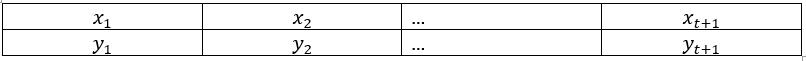


wyraz wolny możemy bardzo łatawo obliczyć metodą interporalcji Lagrange'a w punkcie $x = 0$:

\begin{equation}
  L(x) = \sum_{i = 1}^{t + 1}y_il_i(x),
\end{equation}

gdzie:

\begin{equation}
  l_i(x) = \prod_{0 < j \leq t + 1, j \neq i}\frac{x - x_j}{x_i - x_j}.
\end{equation}

I to w zasadzie tyle. Jak widać nie zawsze potrzebujemy bardzo skomplikowanych równań i algebry w kryptografii. Dobrze to też było widać przy szyfrze Vernama.


**Zadanie**

Otrzymujesz następujący zestaw punktów:
<table>
  <tr>
    <td>x</td>
    <td>y</td>
  </tr>
  <tr>
    <td>5027</td>
    <td>3699449103382758261754106949207544471454331</td>
  </tr>
  <tr>
    <td>8333</td>
    <td>349576516734879619790566193445084198972308523</td>
  </tr>
  <tr>
    <td>1455</td>
    <td>52758551617965323692566002328583494155</td>
  </tr>
  <tr>
    <td>4905</td>
    <td>2965581782568084168683433606320308652250155</td>
  </tr>
  <tr>
    <td>8966</td>
    <td>675640223694406898403633373039391357127095280</td>
  </tr>
  <tr>
    <td>3169</td>
    <td>58169797939549320184626851454156476789483</td>
  </tr>
  <tr>
    <td>3047</td>
    <td>40855813084060894710898142472133428124971</td>
  </tr>
  <tr>
    <td>6344</td>
    <td>30033876172374373466567262566305934018650758</td>
  </tr>
  <tr>
    <td>7907</td>
    <td>217990565378476135178090255955458242555277691</td>
  </tr>
  <tr>
    <td>4559</td>
    <td>1535290198484552235280022288343332387627403</td>
  </tr>
</table>

Napisz program, przywracający sekret z tych punktów z wykorzystaniem interpolacji Lagrange'a. Dla ułatwienia dodam, że sekretem jest liczba 2030. Wskazówka: możesz się zetknąć z problemem dokładności dzielenia, ale na szczęście w Pythonie jest coś takiego jak klasa *Decimal*.

Utwórz własny zestaw punktów, a sekretem niech będzie Twój rok urodzenia. Wykorzystaj napisany program do przywrócenia i tego sekretu (sprawdź czy się zgadza).

In [8]:
from decimal import Decimal, getcontext
getcontext().prec = 100

In [9]:
def reveal_secret_shamir(points):
    points_dec = [(Decimal(x), Decimal(y)) for x, y in points]
    
    def l(i, xi):
        prod = Decimal(1)
        for j, (xj, _) in enumerate(points_dec):
            if i == j:
                continue
            prod *= xj / (xj - xi)
        return prod
    
    result = Decimal(0)
    for i, (xi, yi) in enumerate(points_dec):
        result += yi * l(i, xi)
        
    return result

In [10]:
points = [(
    5027,
    3699449103382758261754106949207544471454331,
  ),
  (
    8333,
    349576516734879619790566193445084198972308523,
  ),
  (
    1455,
    52758551617965323692566002328583494155,
  ),
  (
    4905,
    2965581782568084168683433606320308652250155,
  ),
  (
    8966,
    675640223694406898403633373039391357127095280,
  ),
  (
    3169,
    58169797939549320184626851454156476789483,
  ),
  (
    3047,
    40855813084060894710898142472133428124971,
  ),
  (
    6344,
    30033876172374373466567262566305934018650758,
  ),
  (
    7907,
    217990565378476135178090255955458242555277691,
  ),
  (
    4559,
    1535290198484552235280022288343332387627403,
  )]

In [11]:
round(reveal_secret_shamir(points))

2030

In [12]:
s = 2000

In [13]:
A = np.random.choice(np.arange(1, 1000), size=9, replace=False)

In [14]:
A

array([591, 610, 445,  90, 930, 277, 287, 700, 159])

In [15]:
def get_y(A, s, x):
    y = s
    for i, a in enumerate(A):
        y += int(a) * pow(x, i + 1)
    return y

In [16]:
points = []
X = np.random.choice(np.arange(100, 1000), size=10, replace=False)
for x in X:
    x = int(x)
    points.append((x, get_y(A, s, x)))

In [17]:
points

[(154, 7968146419232334816710),
 (315, 4922975819734835435526665),
 (982, 135626329330829906553876321914),
 (384, 29196730610674567020019280),
 (652, 3408395328858641296837996004),
 (362, 17180273035462528996593974),
 (316, 5065210157172559614956084),
 (728, 9187544559175012139829226232),
 (228, 269855691899022233486732),
 (252, 663034171796506494617204)]

In [18]:
round(reveal_secret_shamir(points))

2000

### Wizualne dzielenie sekretu

A co jeżeli matematyka w ogóle nie jest nam potrzebna przy dzieleniu sekretu, a wystarczą tylko sprawne oczy i podstawowe umiejętności programistyczne? Da się, tylko będziemy musieli się pobawić trochę pikselami.

W najprostszej wersji wizualne dzielenie sekretu polega na utworzeniu z obrazu binarnego (takiego którego piksele mają tylko wartości 0 lub 255) zawierającego sekretną wiadomość, dwóch graficznych udziałów które po nałożeniu na siebie (nałożenie się to operacja OR na odpowiadających sobie pikselach z dwóch różnych udziałów) pozwalają odkryć sekret. Istotne jest to, że z pojedynczego udziału nie ma możliwości przywrócenia nawet najmniejszej części pierwotnego sekretu. Algorytm ten jest więc bezpieczny teorio-informacyjne.

Do utworzenia obu udziałów należy użyć specjalnych bloków pikseli, np.:

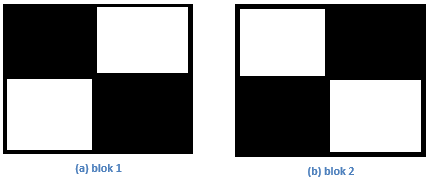

Każdemu pikselowi obrazu wejściowego odpowiada 4 pikselowy blok na obu udziałach (oznacza to, że oba udziały są 2 razy wyższe i 2 razy szersze niż obraz wejściowy). Jeżeli w obrazie wejściowym czytany jest piksel biały, w pierwszym udziale ustawiany jest blok (a), a w drugim (b), lub w pierwszym udziale ustawiany jest blok (b), a w drugim (a) – wybór jest losowy. Jeżeli czytany piksel jest czarny w pierwszym i drugim udziale ustawiany jest blok (a), lub w pierwszym i drugim udziale ustawiany jest blok (b) – wybór kombinacji również jest losowy. Istnieją inne rodzaje bloków do tworzenia udziałów, jak np.:

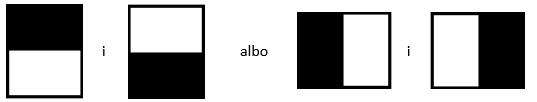

Ale powodują one odpowiednio zniekształcenia w pionie lub poziomie przy odtwarzaniu sekretu. Poniżej przykład sekretu, udziałów i odtworzenia sekretu z udziałów z użyciem bloków (a) i (b):

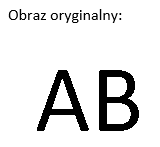

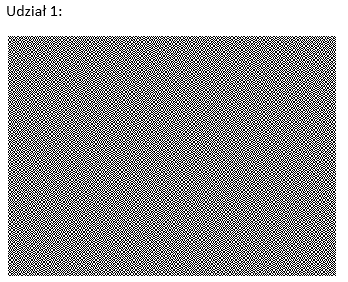

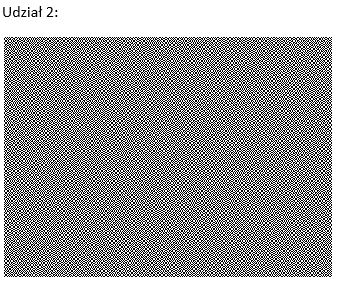

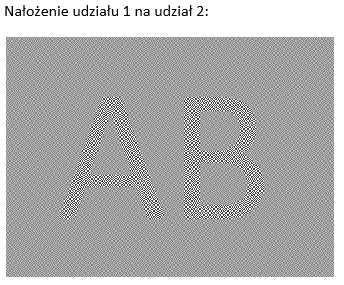

Ta technika jest o tyle ciekawa, że działa nie tylko na komputerze. Gdyby tak wziąć i oba udziały wydrukować na kartkach A4, a następnie nałożyć kartki na siebie i popatrzyć pod światło, sekretny tekst byłby wyraźnie widoczny. 

Ta metoda dotyczy bitmap i zawsze polega na utworzeniu dwóch udziałów. Istnieją metody pozwalajace na operowanie na obrazach w kolorze i pozwalajace na utworzenie większej liczby udziałów - ale one są już dość skomplikowane.

**Zadanie**

Napisz skrypt tworzący udziały z bitmapy, oraz skrypt nakładający dwa udziały i zapisujący wynik w formie obrazu. Gdy to zrobisz, utwórz prosty obraz czarno-biały, utwórz z niego udziały, nałóż udziały i zapisz wynik.

Poza tym, otrzmujesz 10 udziałów w folderze *Obrazy_dzielenie_sekretu*. Dwa z nich kodują tajne hasło, reszta to przypadkowy szum. Zapisz wynik nałożenia dwóch udziałów kodujących hasło.

In [414]:
from PIL import Image
from matplotlib import pyplot as plt

In [167]:
def hide_bitmap_secret(input_filename, output_filename1, output_filename2):
    with Image.open(input_filename) as im:
        im_arr = np.asarray(im.getchannel(0) )
    x_shape, y_shape = im_arr.shape
    
    new_shape = 2 * x_shape, 2 * y_shape, 3
    result1 = np.zeros(new_shape, dtype=np.uint8)
    result2 = np.zeros(new_shape, dtype=np.uint8)
    
    block1 = np.array([[[0, 0, 0], [255, 255, 255]], [[255, 255, 255], [0, 0, 0]]])
    block2 = np.array([[[255, 255, 255], [0, 0, 0]], [[0, 0, 0], [255, 255, 255]]])
    
    for x in range(x_shape):
        for y in range(y_shape):
            first = np.random.choice([True, False])
            elem = im_arr[x, y]
            result1[x*2:(x + 1)*2, y*2:(y + 1)*2] = block1 if first else block2
            result2[x*2:(x + 1)*2, y*2:(y + 1)*2] = block1 if (first and elem == 0) or (not first and elem != 0) else block2
    
    new_im1 = Image.fromarray(result1)
    new_im1.save(output_filename1)
    new_im2 = Image.fromarray(result2)
    new_im2.save(output_filename2)

In [195]:
def reveal_bitmap_secret(filename1, filename2, result_filename=None):
    with Image.open(filename1) as im:
        im1_arr = np.asarray(im)
    with Image.open(filename2) as im:
        im2_arr = np.asarray(im)

    result = (np.logical_or(im1_arr, im2_arr)*255).astype(np.uint8)
    
    new_im = Image.fromarray(result)
    if result_filename is not None:
        new_im.save(result_filename)
    
    return new_im

In [188]:
hide_bitmap_secret("secret.png", "output_secret1.png", "output_secret2.png")

In [190]:
secret_res = reveal_bitmap_secret("output_secret1.png", "output_secret2.png", "secret_result.png")

1, 2:


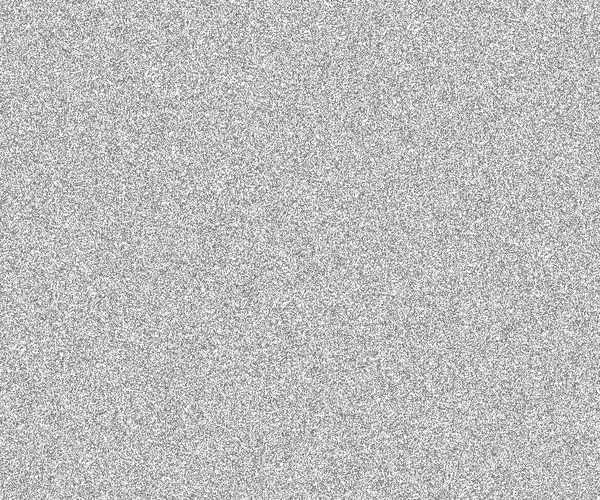

1, 3:


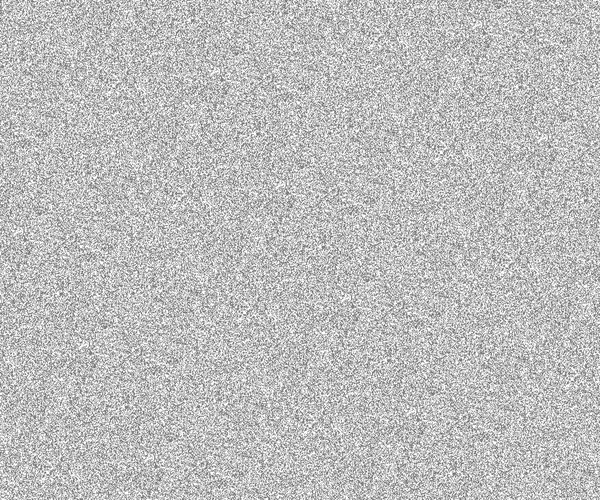

1, 4:


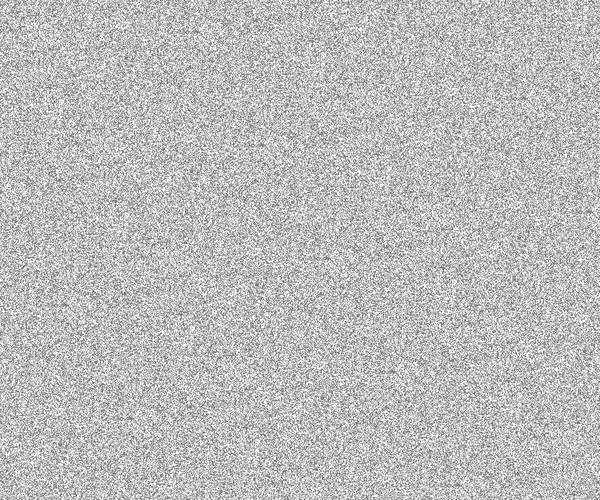

1, 5:


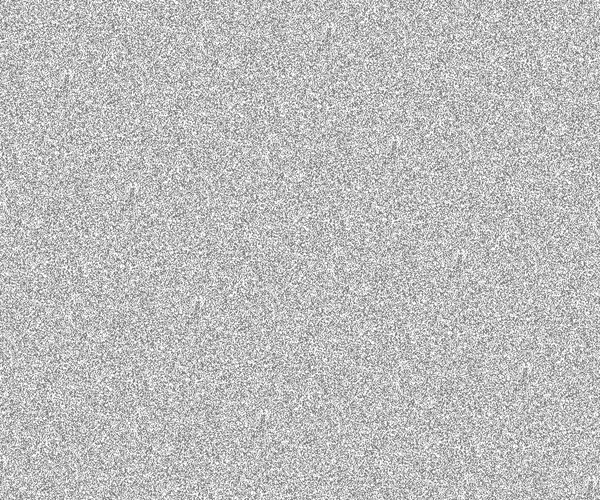

1, 6:


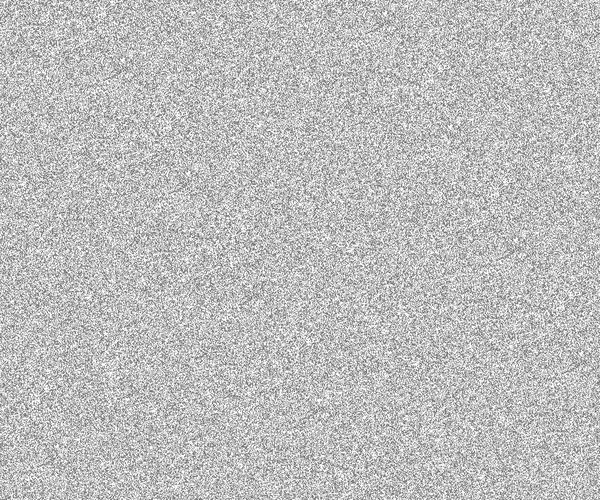

1, 7:


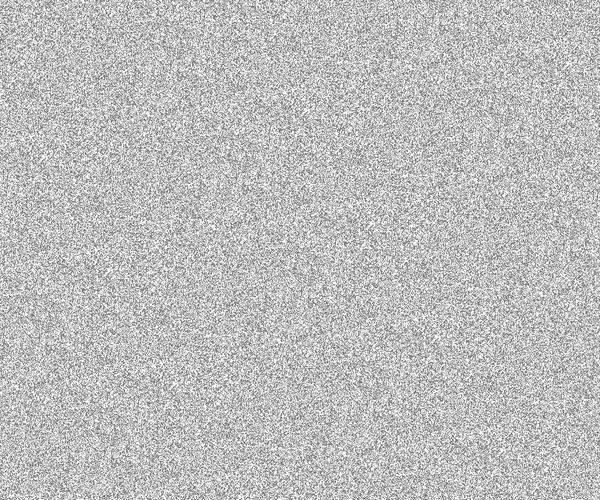

1, 8:


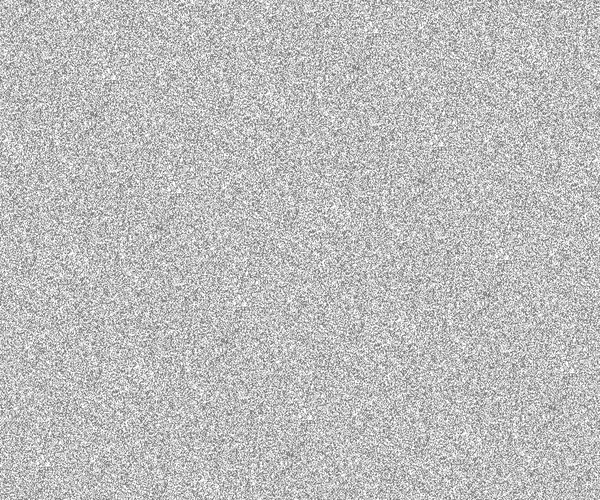

1, 9:


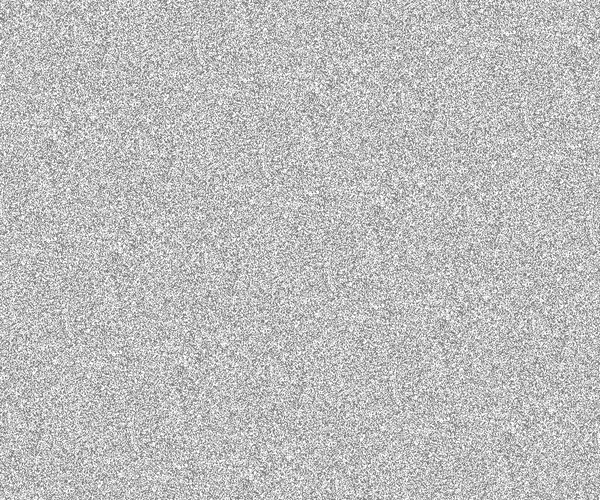

1, 10:


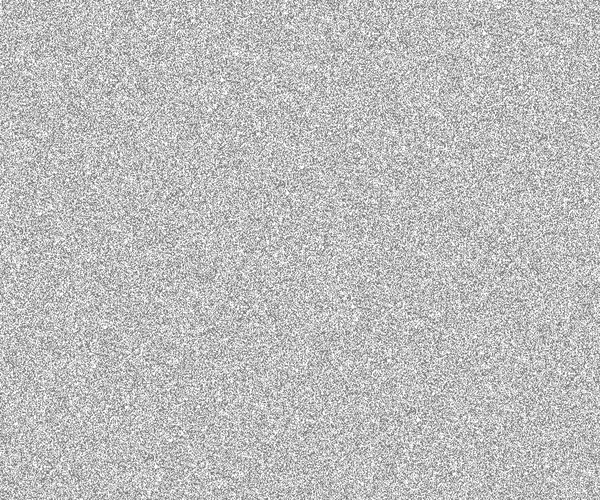

2, 3:


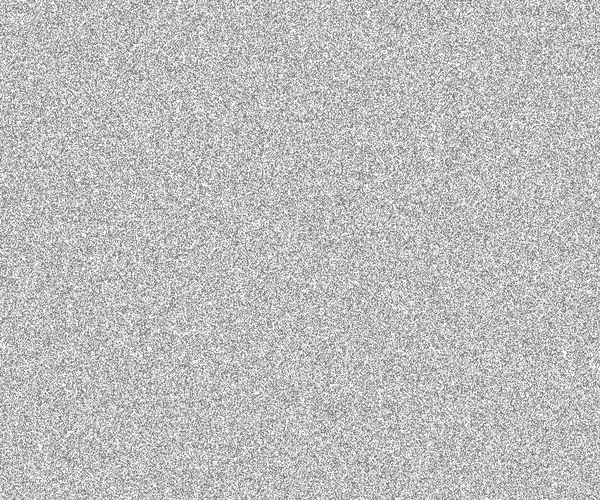

2, 4:


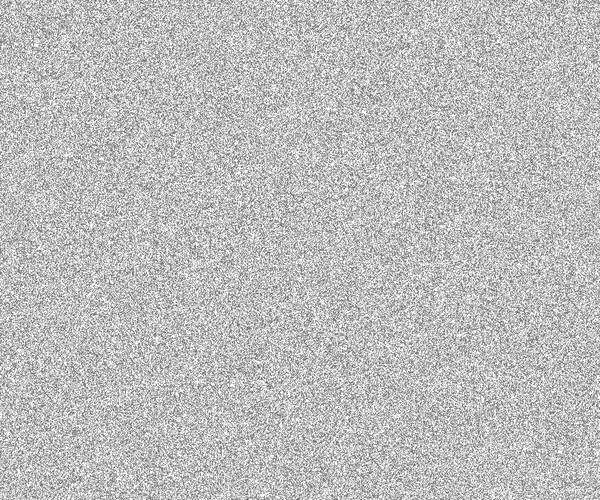

2, 5:


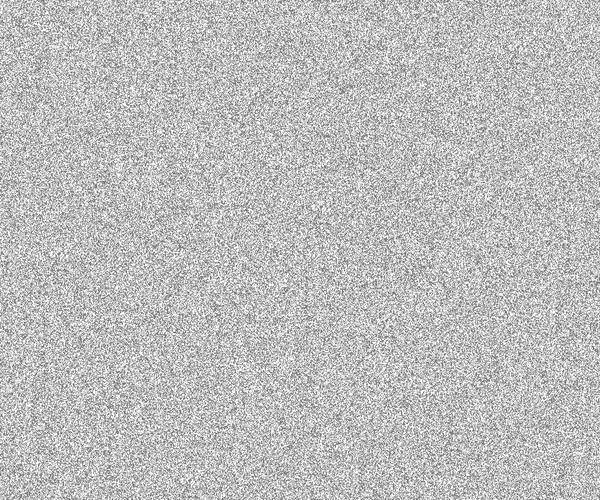

2, 6:


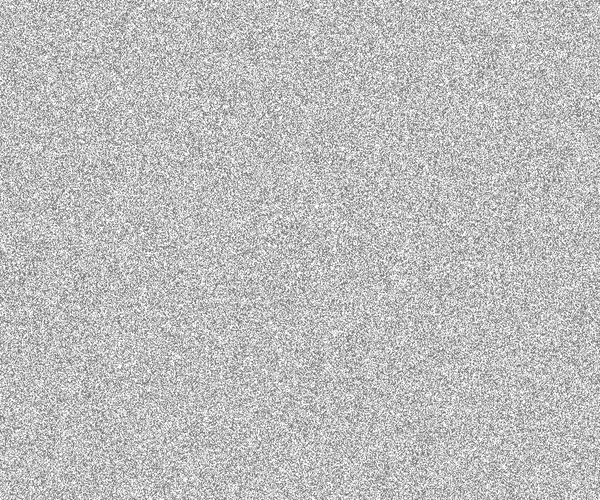

2, 7:


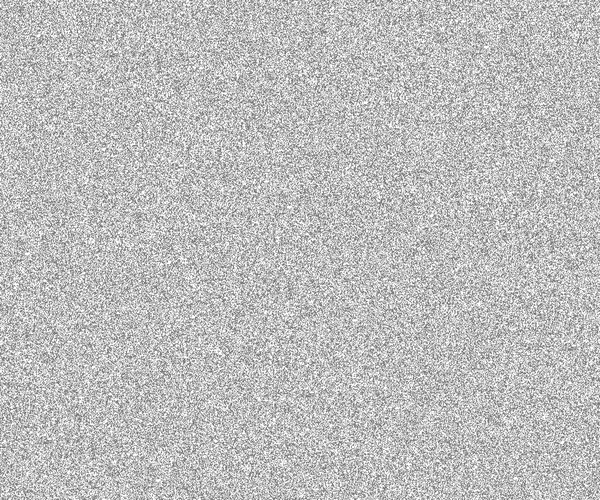

2, 8:


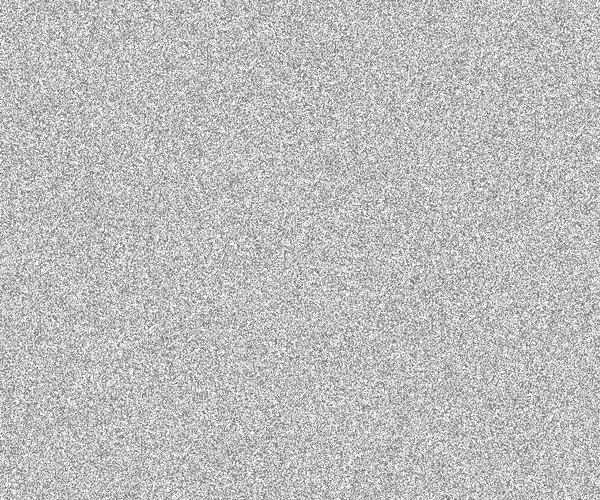

2, 9:


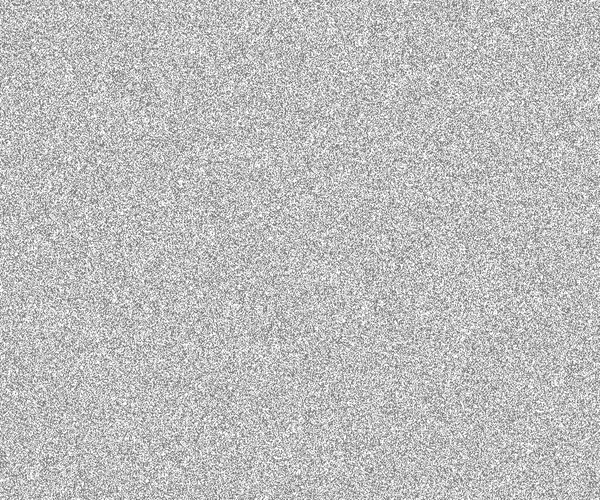

2, 10:


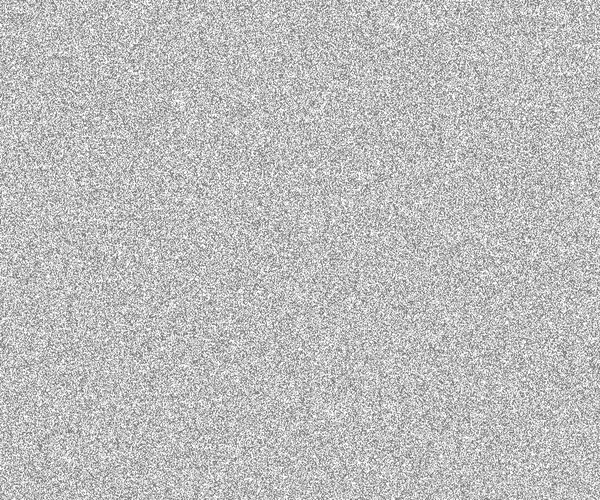

3, 4:


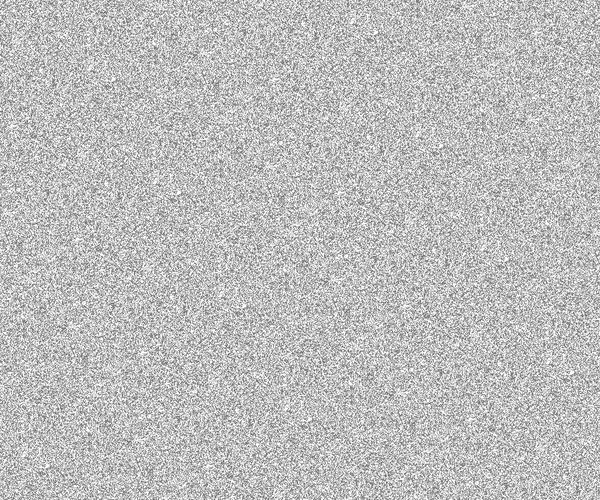

3, 5:


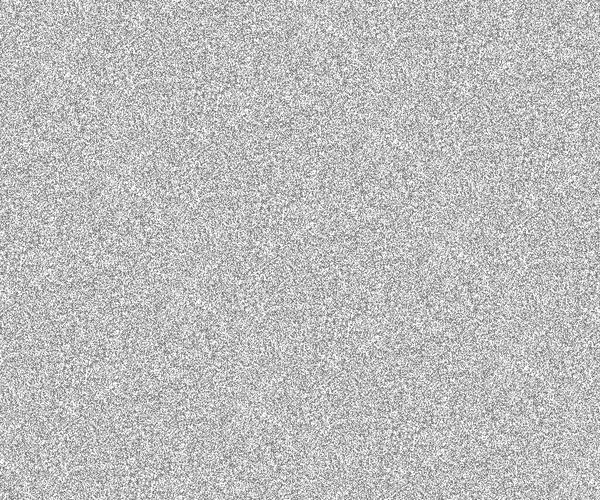

3, 6:


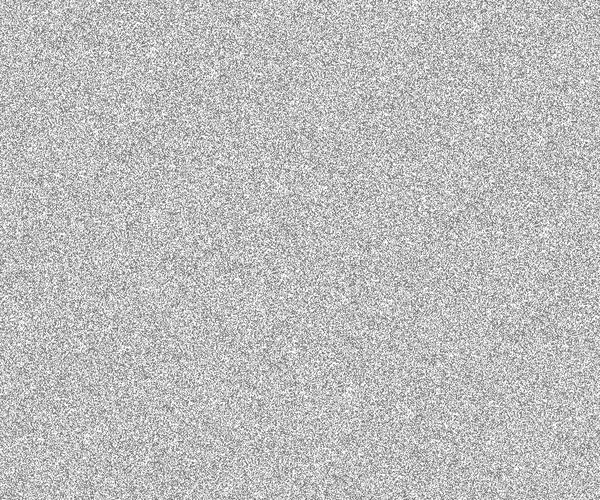

3, 7:


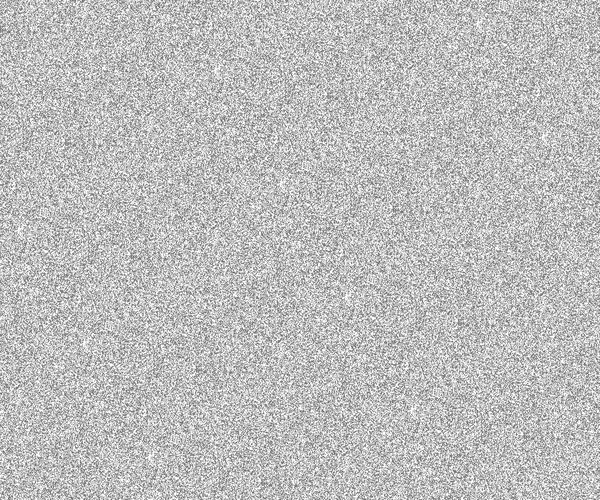

3, 8:


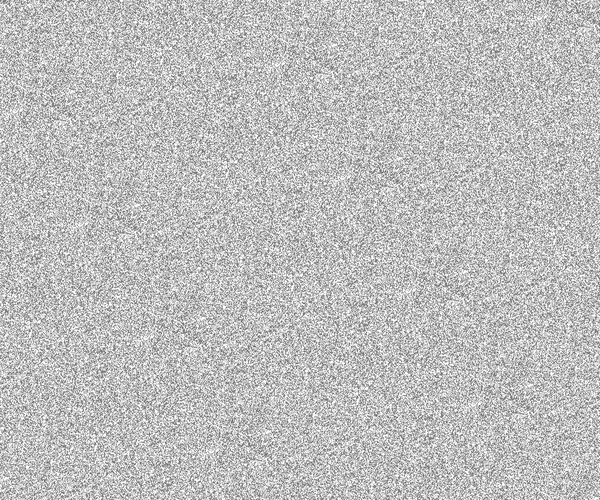

3, 9:


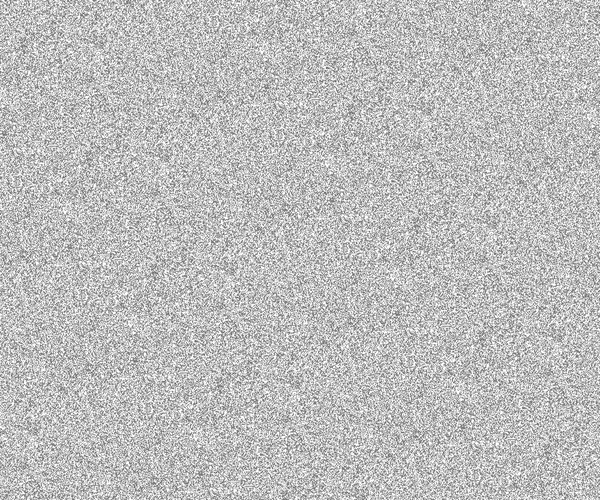

3, 10:


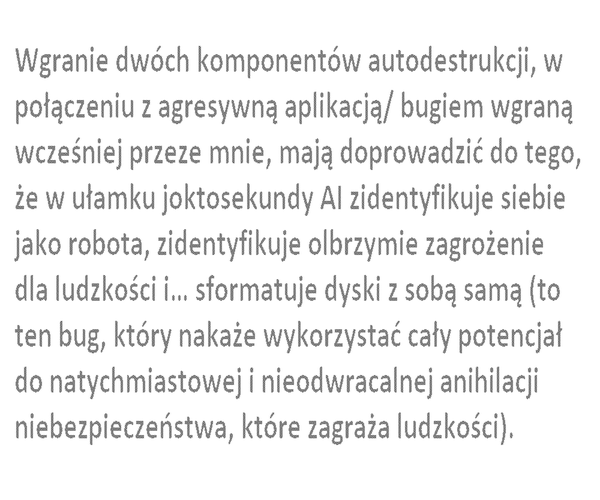

4, 5:


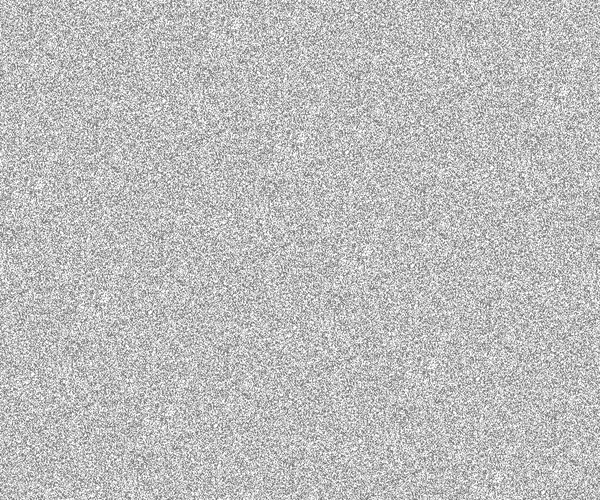

4, 6:


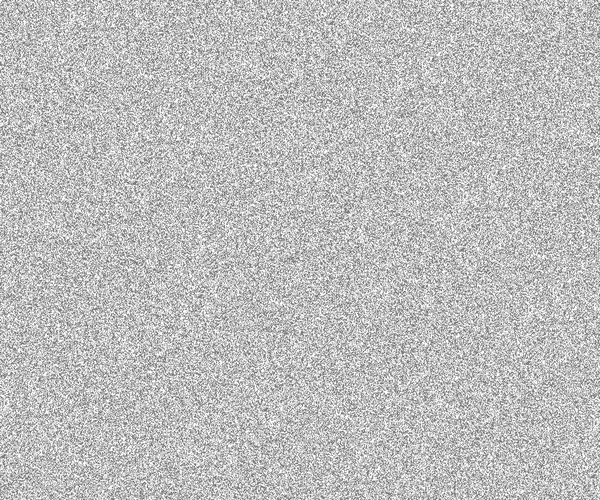

4, 7:


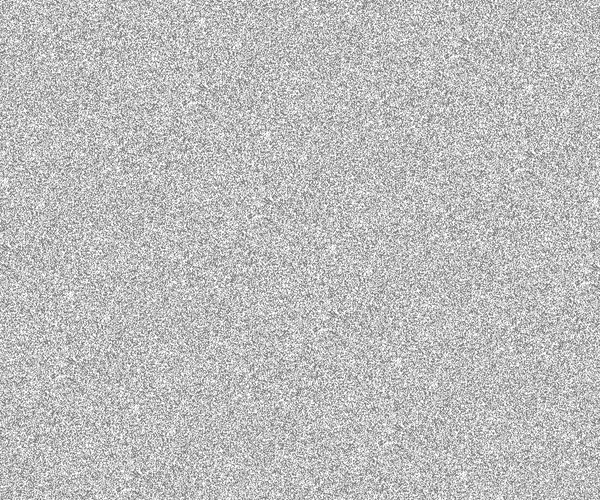

4, 8:


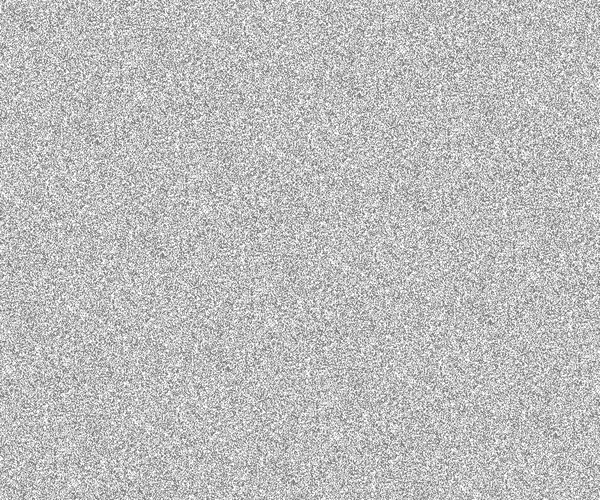

4, 9:


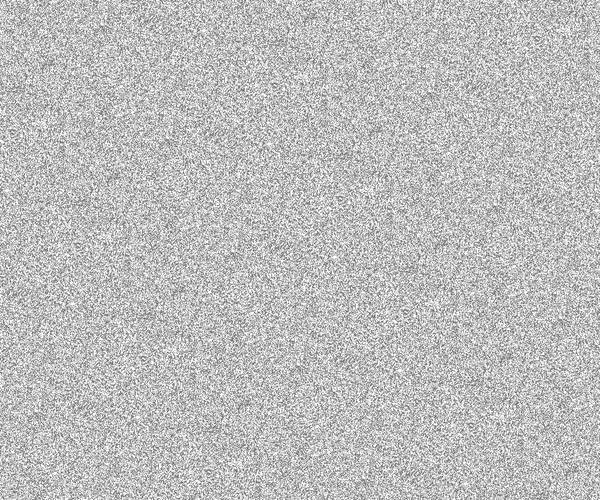

4, 10:


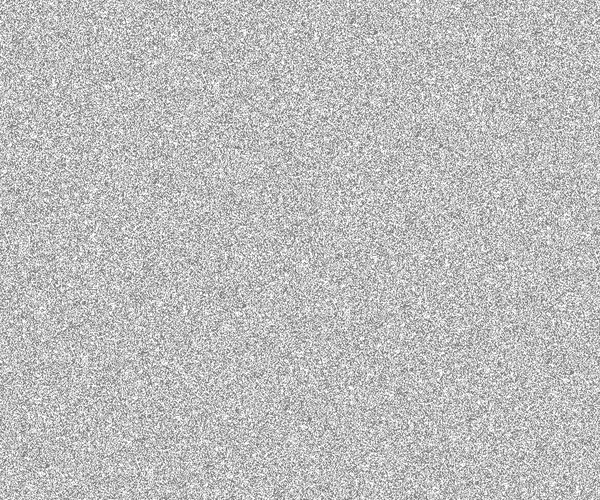

5, 6:


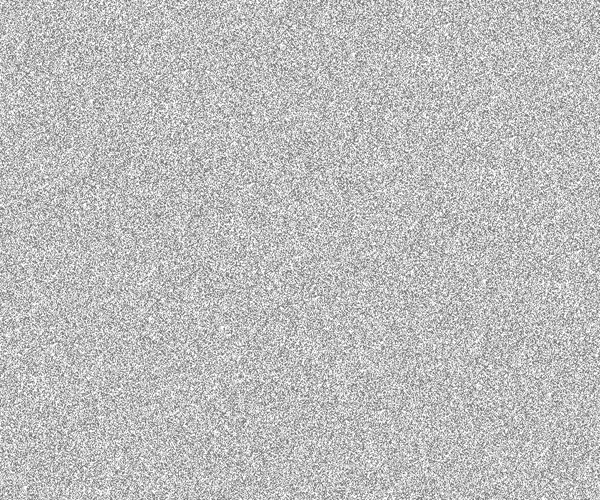

5, 7:


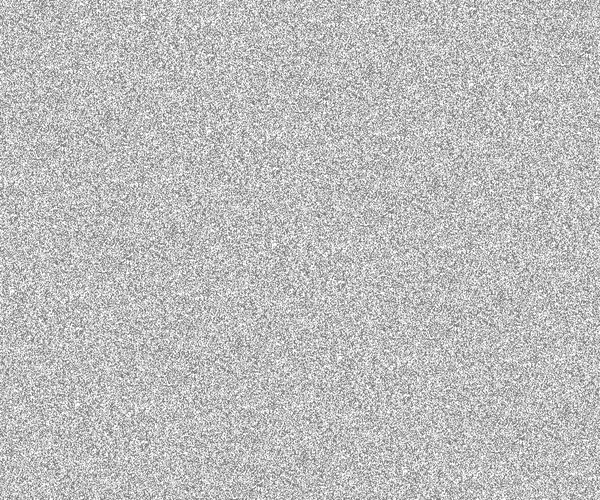

5, 8:


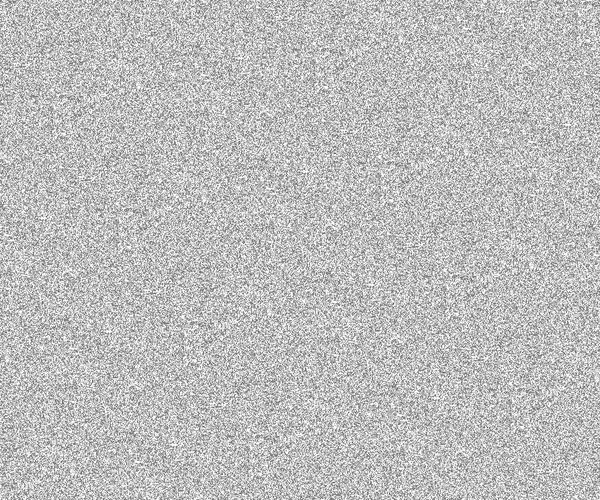

5, 9:


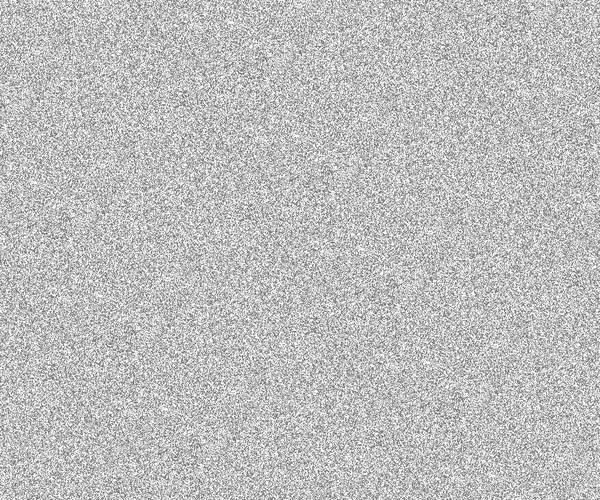

5, 10:


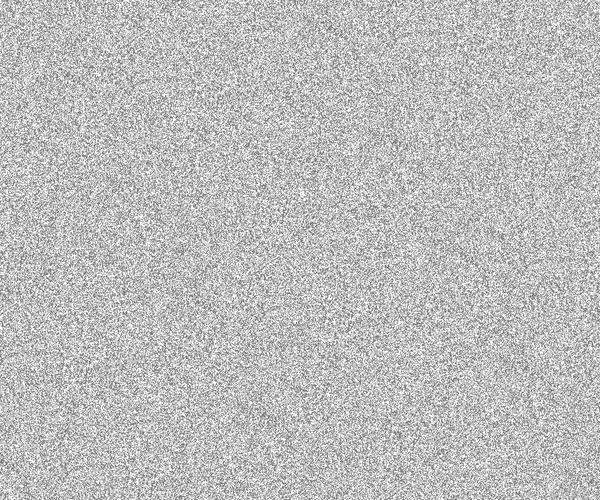

6, 7:


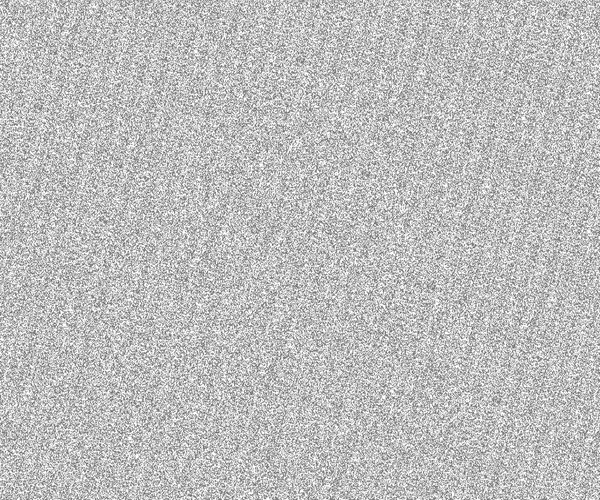

6, 8:


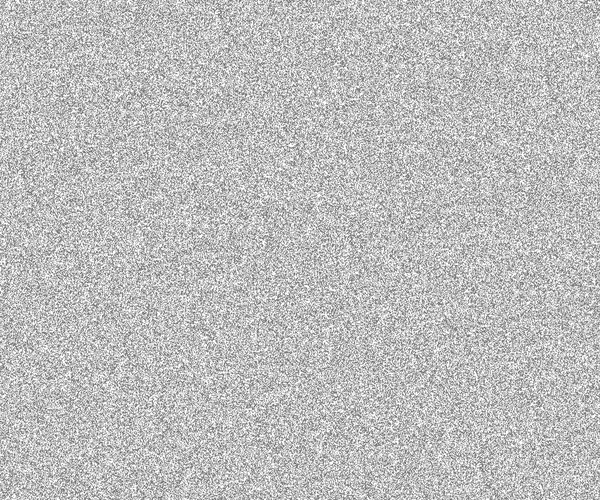

6, 9:


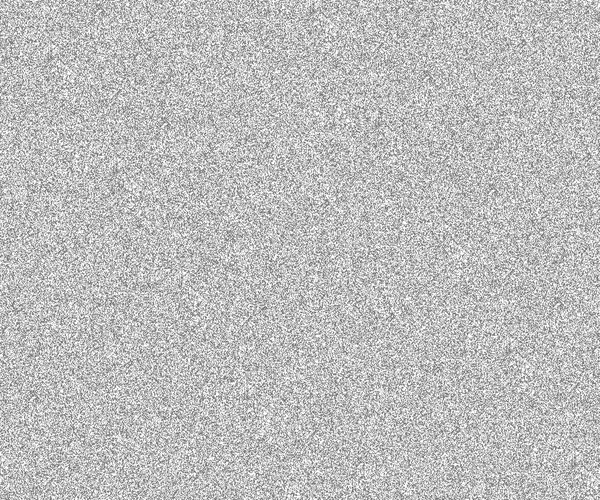

6, 10:


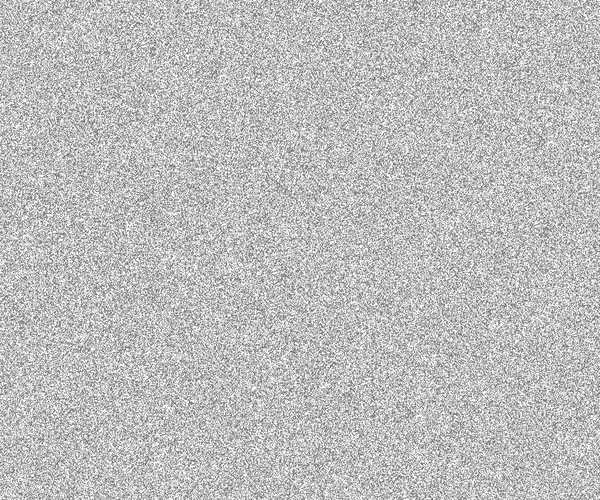

7, 8:


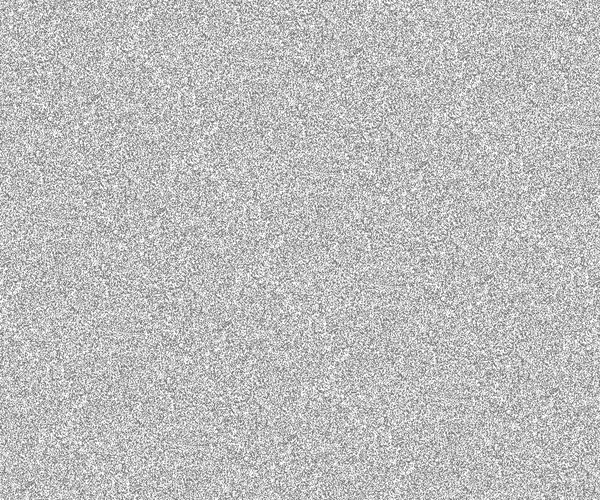

7, 9:


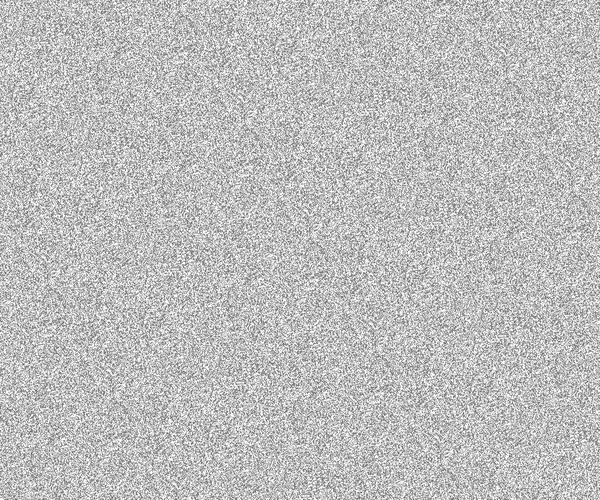

7, 10:


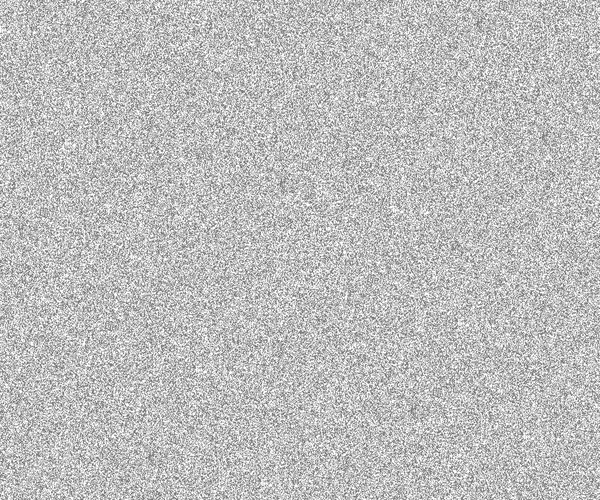

8, 9:


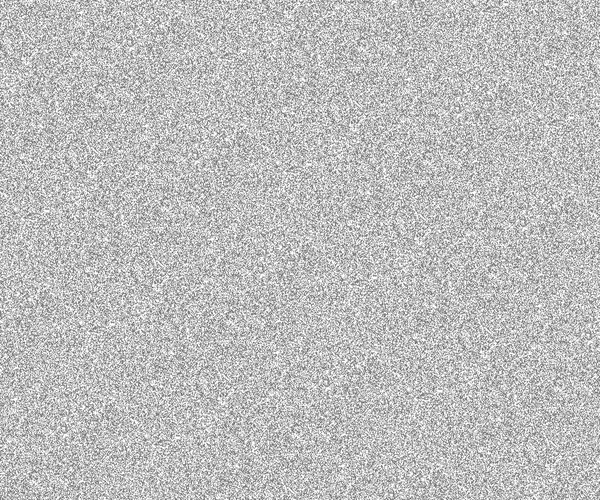

8, 10:


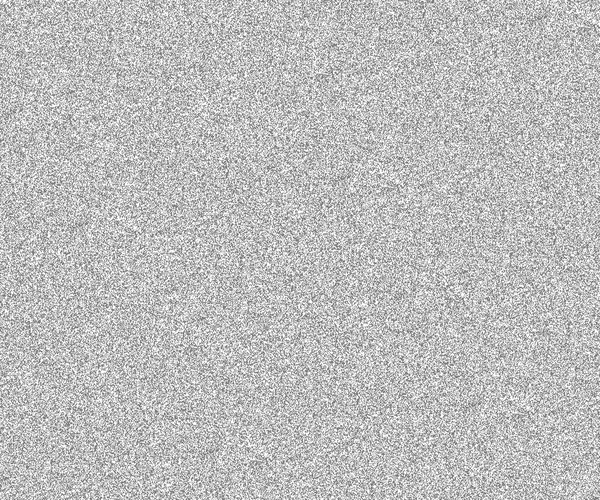

9, 10:


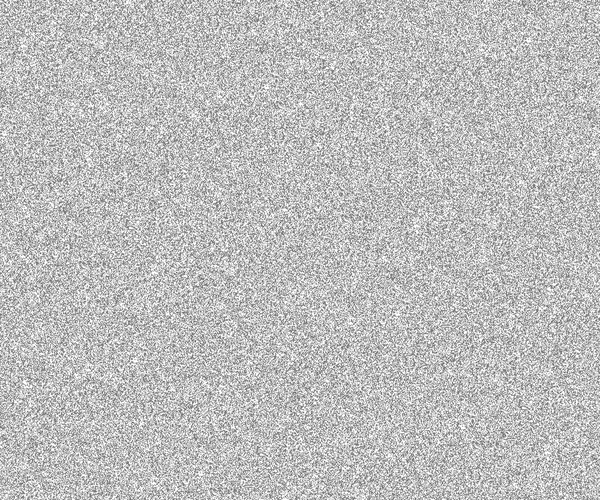

In [205]:
im_dir = "Obrazy_dzielenie_sekretu"

for i in range(1, 10):
    for j in range(i + 1, 11):
        print(f"{i}, {j}:")
        res_im = reveal_bitmap_secret(f"{im_dir}/{i}.png", f"{im_dir}/{j}.png")
        display(res_im.resize((res_im.height//2, res_im.width//4), Image.LANCZOS))

## Steganografia

Temat zapewne już większości znany, choćby przez projekty. Technika działająca w myśl zasady: *nie będziesz probował dostać się do treści wiadomości, jeśli nie wiesz, że wiadomość w ogóle istnieje*. Znowu wdzięcznym przedmiotem są tu obrazy, ale także np. pliki dżwiękowe. My skupimy się na obrazach, bo są o wiele łatwiejsze w obróbce, a skutek osiągniemy taki sam. Do zapamiętania jest natomiast jedna rzecz: do podstawowych metod steganografii nadają się pliki nie podlegające kompresji. A więc dla techniki opisanej poniżej dobre formaty to np.PNG i WAV np. złe formaty to np.: JPG oraz MP3.

Podstawową metodą steganograficzną jest tzw. LSB, czyli z ang. *Least Significant Bit*. W zamyśle chodzi o to, aby sekretną wiadomość zdekodować na ciąg binarny i ukrywać bit po bicie na najmniej znaczących bitach obrazu. I tu znowu jest sporo szkół i wariacji: można ukrywać po dwa bity - ale to może już spowodować widoczne zmiany w obrazie. Jeżeli obraz jest w kolorze, można ukrywać na jednym kanale, można na wszystkich. Wykorzystanie wiekszej liczby bitów pozwala na ukrycie większych wiadomości, ale naraża na ryzyko wykrycia, itp. itd. 

Steganografia nie jest w żaden sposób oficjalnie ustandaryzowana. No bo *czemu ktoś miałby chcieć coś ukrywać*, prawda? ;)

**Zadanie**

Wybierz sobie jakikolwiek obraz png w kolorze. Efektem jego wczytania powinno być uzyskanie trzech macierzy bajtów: odpowiednio kodujące R, G oraz B. Rozmiar każdej macierzy będzie oczywiście taki sam i będzie zależał od rozmiaru obrazu. Następnie zakoduj w obrazie wiadomość, ale z uwzględnieniem następujących założeń:
1. korzystamy z metody LSB,
2. koduj po jednym bicie na co dziesiątym bajcie, poczynając od pierwszego bajtu tablicy $R$,
3. rotuj kanałami w kolejności R, G, B,
4. w wiadomości korzystaj tylko ze znaków ASCII, a co za tym idzie przyjmij, że 1 znak to 1 bajt. Wiadomość ma się zaczynać od bajtu $0x02$ (z ASCII STX - czyli *Start of Text*), a kończyć bajtem $0x03$ (z ASCII ETX - czyli *End of Text*). Wartości te mogą być dodawane już na etpaie kodowania wiadomości do obrazu,
5. kontroluj, czy wiadomość, którą ktoś próbuje zakodować nie jest za długa dla danego obrazu - jeżeli jest, zwróć błąd.

To znaczy: pierwszy bit wiadomości będzie kodowany w $R[0]$, drugi w $G[10]$, trzeci w $B[20]$, czwarty w $R[30]$ itd. Zapisz obraz z zakodowaną wiadomością w formie umożliwiającej jego oglądnięcie. Wczytaj obraz z zakodowaną wiadomością, zdekoduj ją oraz przedstaw jej treść na ekranie.

In [7]:
def to_bits(M):
    for b in M:
        for i in range(7, -1, -1):
            yield (b>>i) & 1

In [77]:
def im_hide(msg, input_filename, output_filename, offset=0, stride=10):
    with Image.open(input_filename) as im:
        im_arr = np.asarray(im)
    
    x_shape, y_shape, _ = im_arr.shape
    pos = offset * 8 * stride
    msg = b"\x02" + msg + b"\x03"
    if x_shape * y_shape < len(msg) * 8 * stride + pos:
        raise Exception("message too large")
    
    for b in to_bits(msg):
        im_arr[pos//y_shape, pos%y_shape][pos%3] = (im_arr[pos//y_shape, pos%y_shape][pos%3]&0xfe) | b
        pos += stride
    
    new_im = Image.fromarray(im_arr)
    new_im.save(output_filename)

In [78]:
im_hide(b"Tajna wiadomosc", "../zipsten/d17.png", "hidden.png", offset=3)

In [79]:
def im_reveal(filename, stride=10):
    with Image.open(filename) as im:
        im_arr = np.asarray(im)
    
    x_shape, y_shape, _ = im_arr.shape
    
    result = bytearray()
    result_byte_counter = 0
    result_byte = 0
    enabled = False
    pos = 0
    
    while True:
        result_byte = (result_byte<<1) | (im_arr[pos//y_shape, pos%y_shape][pos%3]&1)
        result_byte_counter += 1
        if result_byte_counter == 8:
            if enabled:
                if result_byte == 3:
                    break
                result.append(result_byte)
            if result_byte == 2:
                enabled = True
            result_byte = 0
            result_byte_counter = 0
        pos += stride
        
    return bytes(result)

In [80]:
im_reveal("hidden.png")

b'Tajna wiadomosc'